In [2]:
import cv2
import os
import glob
from tqdm import tqdm

In [3]:
PATH_violence = "Data/Real Life Violence Dataset/Violence"

In [4]:
os.makedirs('./data/Violence',exist_ok=True)
for path in tqdm(glob.glob(PATH_violence+'/*')):
    fname = os.path.basename(path).split('.')[0]
    vidcap = cv2.VideoCapture(path)
    success,image = vidcap.read()
    count = 0
    while success:
        if count % 5 == 0:
            cv2.imwrite("./data/Violence/{}-{}.jpg".format(fname,str(count).zfill(4)),image)     # save frame as JPEG file      
        success,image = vidcap.read()
        count += 1

  1%|          | 10/1000 [00:02<03:49,  4.32it/s]


KeyboardInterrupt: 

In [5]:
PATH_nonviolence = "Data/Real Life Violence Dataset/NonViolence"

In [23]:
os.makedirs('./data/NonViolence',exist_ok=True)
for path in tqdm(glob.glob(PATH_nonviolence+'/*')):
    fname = os.path.basename(path).split('.')[0]
    vidcap = cv2.VideoCapture(path)
    success,image = vidcap.read()
    count = 0
    while success:
        if count % 5 == 0:
            cv2.imwrite("./data/NonViolence/{}-{}.jpg".format(fname,str(count).zfill(4)),image)     # save frame as JPEG file      
        success,image = vidcap.read()
        count += 1

100%|██████████| 1000/1000 [02:23<00:00,  6.98it/s]


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory
import torch.nn.functional as F
import pathlib


cudnn.benchmark = True
plt.ion()   # interactive mode

In [3]:
# Hyper-parameters 
num_epochs = 15
batch_size = 4
learning_rate = 0.001

In [4]:
# Data augmentation and normalization for training
# Just normalization for validation
train_transform = transforms.Compose([
        transforms.Resize(226),
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomGrayscale(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
   
val_transform =transforms.Compose([
        transforms.Resize(226),
        transforms.CenterCrop(224),
        transforms.RandomGrayscale(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])



In [20]:

train_path = 'data/fight'

trainset = torchvision.datasets.ImageFolder(train_path, transform=train_transform)

train_size = int(0.8 * len(trainset))
test_size = len(trainset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(trainset, [train_size, test_size])

trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

testloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=2)

In [21]:
print(trainloader)

In [22]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")



In [23]:
root=pathlib.Path(train_path)
classNames=sorted([j.name.split('/')[-1] for j in root.iterdir()])
print(classNames)

['NonViolence', 'Violence']


In [24]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
dataiter = iter(trainloader)
images, labels = next(dataiter)

# Make a grid from batch
out = torchvision.utils.make_grid(images)


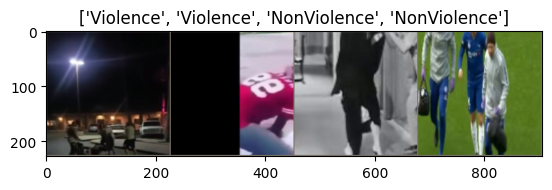

In [25]:

imshow(out, title=[classNames[x] for x in labels])

In [26]:
conv1 = nn.Conv2d(3, 6, 5)
pool = nn.MaxPool2d(2, 2)
conv2 = nn.Conv2d(6, 16, 5)
x = conv1(images)
print(x.shape)
x = pool(x)
print(x.shape)
x = conv2(x)
print(x.shape)
x = pool(x)
print(x.shape)

torch.Size([4, 6, 220, 220])
torch.Size([4, 6, 110, 110])
torch.Size([4, 16, 106, 106])
torch.Size([4, 16, 53, 53])


In [27]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 53 * 53, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, len(classNames))

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
net = Net().to(device)

In [28]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=learning_rate, momentum=0.9)


# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [29]:
train_losses, val_losses = [], []
for epoch in range(num_epochs):  # loop over the dataset multiple times
    net.train()
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data[0].to(device), data[1].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * labels.size(0)
    train_loss = running_loss / len(trainloader.dataset)
    train_losses.append(train_loss)

    #Validation phase
    net.eval()
    running_loss = 0.0
    with torch.no_grad():
        for i, data in enumerate(testloader, 0):
            # Move inputs and labels to the device
            inputs, labels = data[0].to(device), data[1].to(device)
         
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * labels.size(0)
    val_loss = running_loss / len(testloader.dataset)
    val_losses.append(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs} - Train loss: {train_loss}, Validation loss: {val_loss}")


print('Finished Training')

Epoch 1/15 - Train loss: 0.6062668363345642, Validation loss: 0.5380972486722018
Epoch 2/15 - Train loss: 0.5332092762730137, Validation loss: 0.4991933097078548
Epoch 3/15 - Train loss: 0.48844589655535603, Validation loss: 0.45413429062856053
Epoch 4/15 - Train loss: 0.45960165658577407, Validation loss: 0.4400961906656422
Epoch 5/15 - Train loss: 0.4340968953004652, Validation loss: 0.4420322733103992
Epoch 6/15 - Train loss: 0.4234607535881942, Validation loss: 0.4104292813277388
Epoch 7/15 - Train loss: 0.40672593654137223, Validation loss: 0.40584729467724834
Epoch 8/15 - Train loss: 0.40049857650801485, Validation loss: 0.38032548183893766
Epoch 9/15 - Train loss: 0.3832242259396811, Validation loss: 0.36114161919334914
Epoch 10/15 - Train loss: 0.37522424002990423, Validation loss: 0.347635265955029
Epoch 11/15 - Train loss: 0.3752229683957234, Validation loss: 0.37047999044439056
Epoch 12/15 - Train loss: 0.36643755030687286, Validation loss: 0.3729538703466192
Epoch 13/15 - T

In [30]:
def train_model(model, scheduler):
    since = time.time()

    # Create a temporary directory to save training checkpoints
    with TemporaryDirectory() as tempdir:
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')

        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0

        for epoch in range(num_epochs):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0

                # Iterate over data.
                for inputs, labels in trainloader:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    # track history if only in train
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)
                if phase == 'train':
                    scheduler.step()

                epoch_loss = running_loss / len(trainset)
                epoch_acc = running_corrects.double() / len(trainset)

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
                    
                # deep copy the model
                if phase == 'val' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    torch.save(model.state_dict(), best_model_params_path)

            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        print(f'Best val Acc: {best_acc:4f}')

        # load best model weights
        model.load_state_dict(torch.load(best_model_params_path))
    return model

In [31]:
model_fit = train_model(net,  exp_lr_scheduler)

Epoch 0/14
----------
train Loss: 0.3354 Acc: 0.6487
val Loss: 0.3346 Acc: 0.6439

Epoch 1/14
----------
train Loss: 0.3170 Acc: 0.6599
val Loss: 0.3124 Acc: 0.6679

Epoch 2/14
----------
train Loss: 0.2954 Acc: 0.6703
val Loss: 0.2798 Acc: 0.6765

Epoch 3/14
----------
train Loss: 0.2812 Acc: 0.6764
val Loss: 0.2759 Acc: 0.6812

Epoch 4/14
----------
train Loss: 0.2771 Acc: 0.6791
val Loss: 0.2654 Acc: 0.6838

Epoch 5/14
----------
train Loss: 0.2830 Acc: 0.6765
val Loss: 0.2705 Acc: 0.6809

Epoch 6/14
----------
train Loss: 0.2756 Acc: 0.6807
val Loss: 0.2671 Acc: 0.6834

Epoch 7/14
----------
train Loss: 0.2361 Acc: 0.6971
val Loss: 0.2347 Acc: 0.7000

Epoch 8/14
----------
train Loss: 0.2279 Acc: 0.7021
val Loss: 0.2255 Acc: 0.7044

Epoch 9/14
----------
train Loss: 0.2269 Acc: 0.7013
val Loss: 0.2213 Acc: 0.7040

Epoch 10/14
----------
train Loss: 0.2218 Acc: 0.7050
val Loss: 0.2210 Acc: 0.7058

Epoch 11/14
----------
train Loss: 0.2209 Acc: 0.7043
val Loss: 0.2201 Acc: 0.7047

Ep

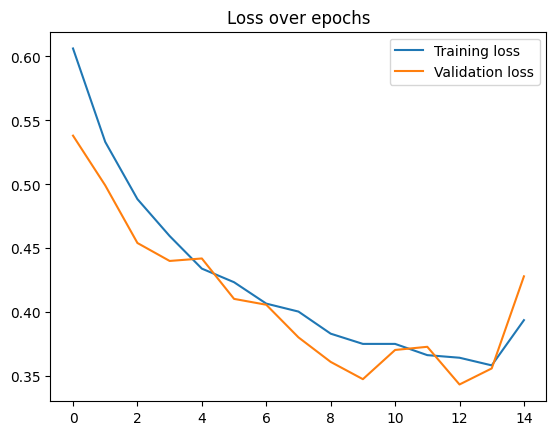

[0.6062668363345642, 0.5332092762730137, 0.48844589655535603, 0.45960165658577407, 0.4340968953004652, 0.4234607535881942, 0.40672593654137223, 0.40049857650801485, 0.3832242259396811, 0.37522424002990423, 0.3752229683957234, 0.36643755030687286, 0.364405460925818, 0.35842843279290043, 0.3937997110067884]
[0.5380972486722018, 0.4991933097078548, 0.45413429062856053, 0.4400961906656422, 0.4420322733103992, 0.4104292813277388, 0.40584729467724834, 0.38032548183893766, 0.36114161919334914, 0.347635265955029, 0.37047999044439056, 0.3729538703466192, 0.34348846368483676, 0.35603870795585396, 0.42806777276747643]


In [32]:
plt.plot(train_losses, label='Training loss')
plt.plot(val_losses, label='Validation loss')
plt.legend()
plt.title("Loss over epochs")
plt.show()
print(train_losses)
print(val_losses)

In [33]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(testloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {classNames[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

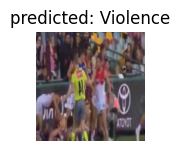

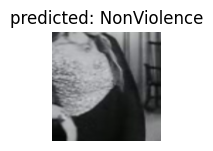

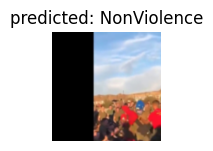

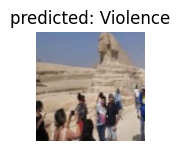

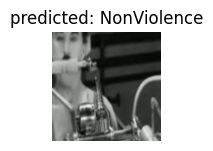

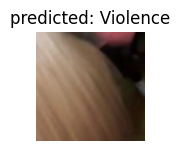

In [34]:
visualize_model(model_fit)

In [35]:
correct = 0
total = 0
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        # calculate outputs by running images through the network
        outputs = model_fit(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the test images: {100 * correct // total} %')

Accuracy of the network on the test images: 88 %


In [36]:
# prepare to count predictions for each class
correct_pred = {classname: 0 for classname in classNames}
total_pred = {classname: 0 for classname in classNames}

# again no gradients needed
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model_fit(images)
        _, predictions = torch.max(outputs, 1)
        # collect the correct predictions for each class
        for label, prediction in zip(labels, predictions):
            if label == prediction:
                correct_pred[classNames[label]] += 1
            total_pred[classNames[label]] += 1


# print accuracy for each class
for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    print(f'Accuracy for class: {classname:5s} is {accuracy:.1f} %')

Accuracy for class: NonViolence is 83.6 %
Accuracy for class: Violence is 92.3 %


In [37]:
def visualize_model_predictions(model,img_path):
    was_training = model.training
    model.eval()

    img = Image.open(img_path)
    img = val_transform(img)
    img = img.unsqueeze(0)
    img = img.to(device)

    with torch.no_grad():
        outputs = model(img)
        _, preds = torch.max(outputs, 1)

        ax = plt.subplot(2,2,1)
        ax.axis('off')
        ax.set_title(f'Predicted: {classNames[preds[0]]}')
        imshow(img.cpu().data[0])

        model.train(mode=was_training)

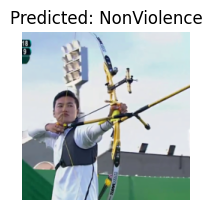

In [39]:
visualize_model_predictions(
    model_fit,
    img_path='data/fight/NonViolence/NV_6-0065.jpg'
)

plt.ioff()
plt.show()

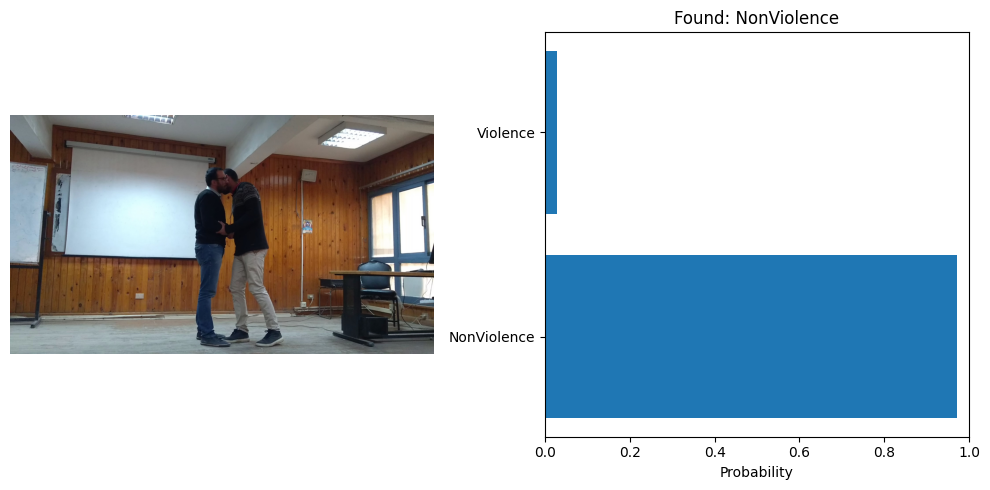

In [42]:
# Load and preprocess the image
def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return image, val_transform(image).unsqueeze(0)

# Predict using the model
def predict(model, image_tensor, device):
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.to(device)
        outputs = model(image_tensor)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
    return probabilities.cpu().numpy().flatten()

# Visualization
def visualize_predictions(original_image, probabilities, class_names):
    fig, axarr = plt.subplots(1, 2, figsize=(10, 5))
    
    # Display image
    axarr[0].imshow(original_image)
    axarr[0].axis("off")
    
    found_classes = []
    for i, x in enumerate(classNames):
        if(probabilities[i] > 0.95):
            found_classes.append(x)
        elif(probabilities[i] > 0.5):
            found_classes.append('maybe ' + x )
    if(found_classes == []):
        found_classes.append('none')

    # Display predictions
    axarr[1].barh(class_names, probabilities)
    axarr[1].set_xlabel("Probability")
    axarr[1].set_title("Found: " + ', '.join(found_classes))
    axarr[1].set_xlim(0, 1)

 

    plt.tight_layout()
    plt.show()

test_image = "data/ValViolence/NonViolence/NV_1-0000.jpg"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

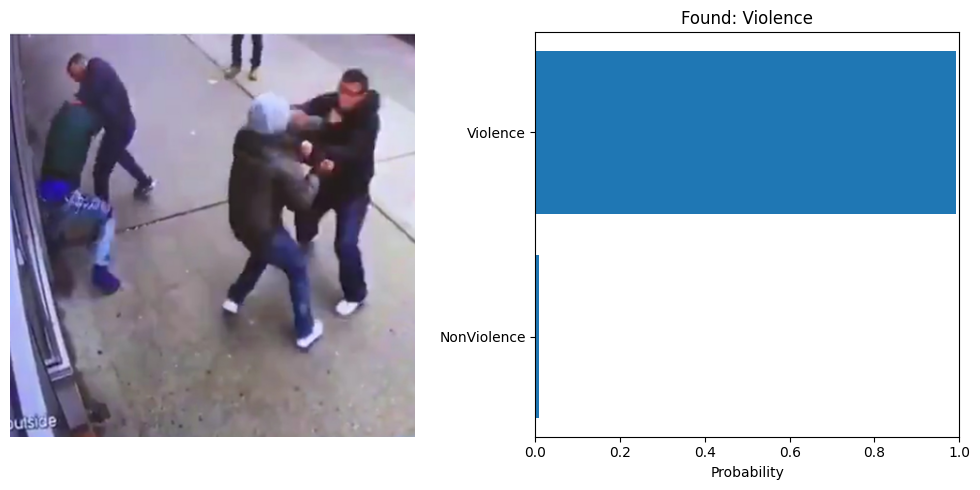

In [54]:
test_image = "data/ValViolence/Other/street_fight.0.jpg"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

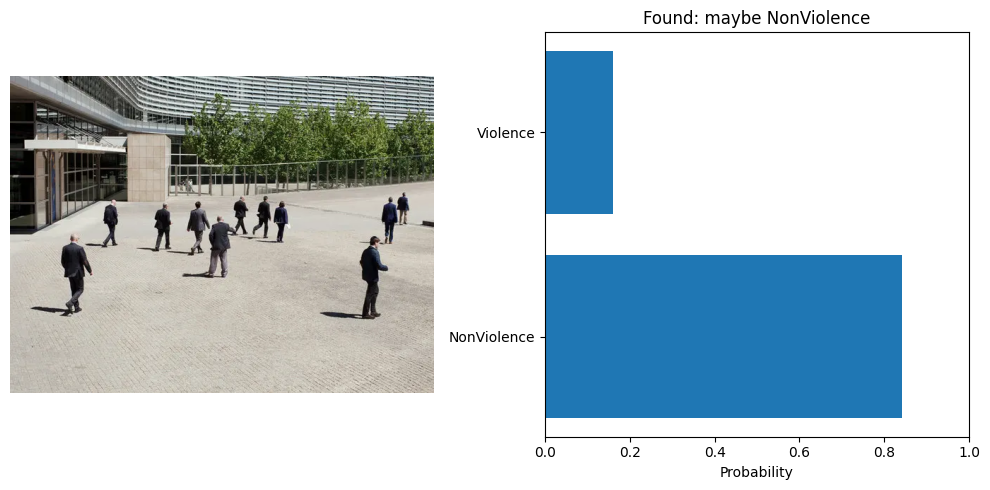

In [56]:
test_image = "data/ValViolence/Other/13cameras10-articleLarge.webp"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

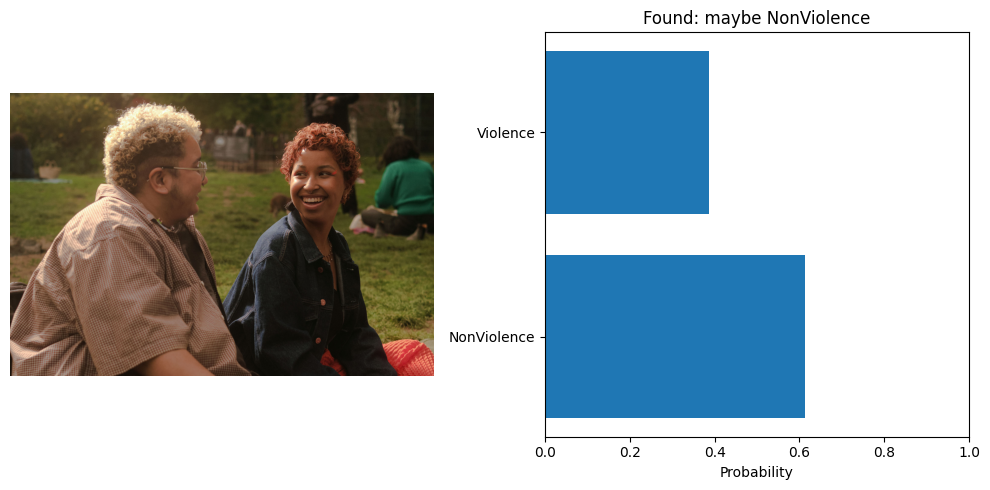

In [57]:
test_image = "data/ValViolence/Other/Science-of-Attraction-feat.jpg"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

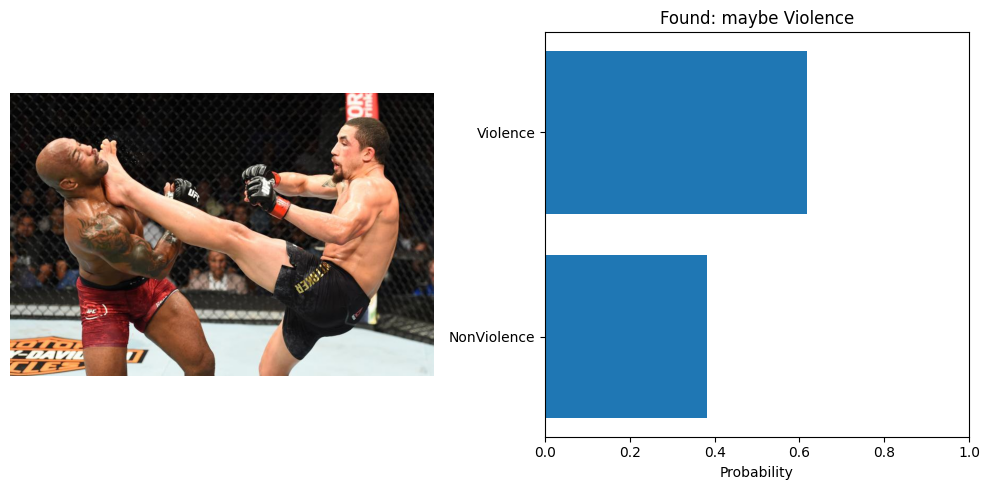

In [58]:
test_image = "data/ValViolence/Other/GettyImages-970681494.jpg"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

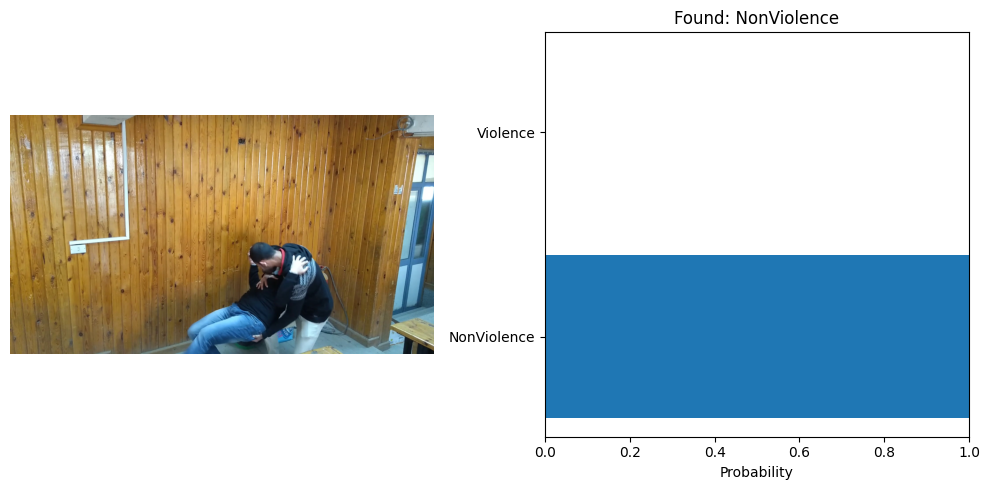

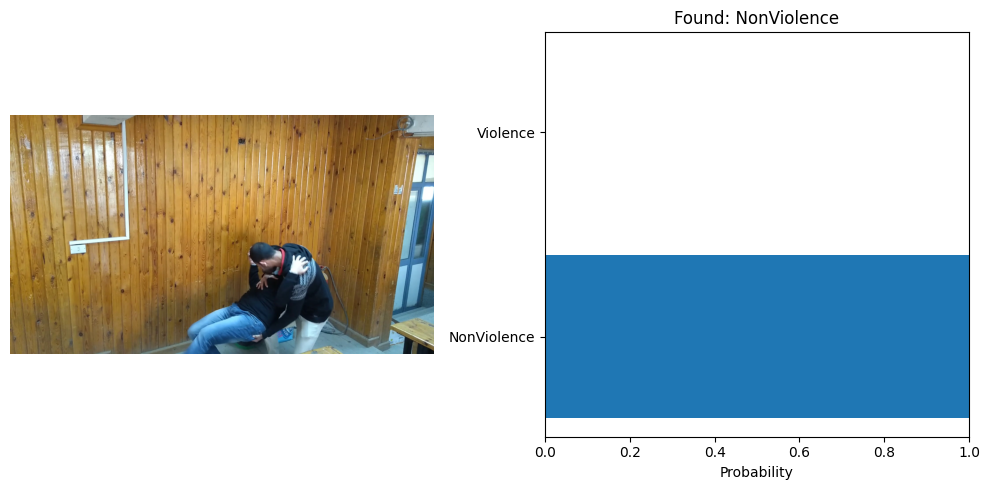

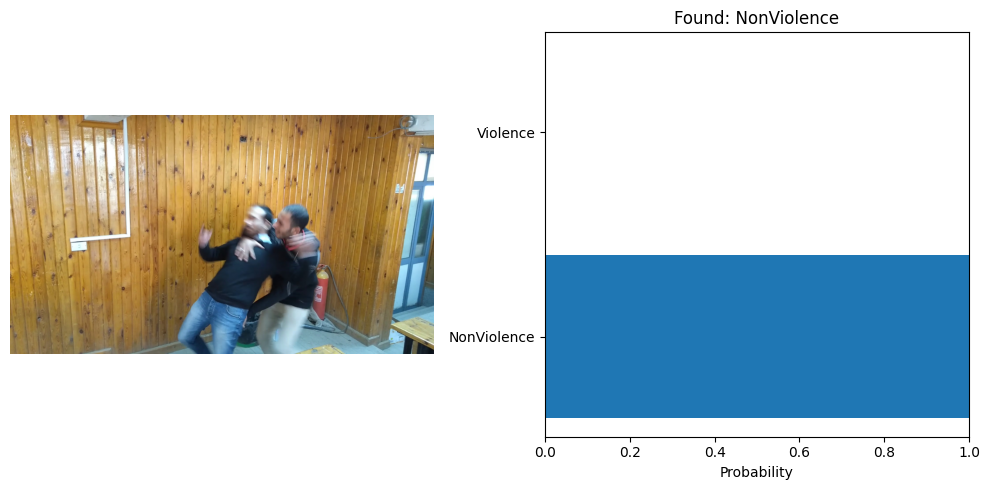

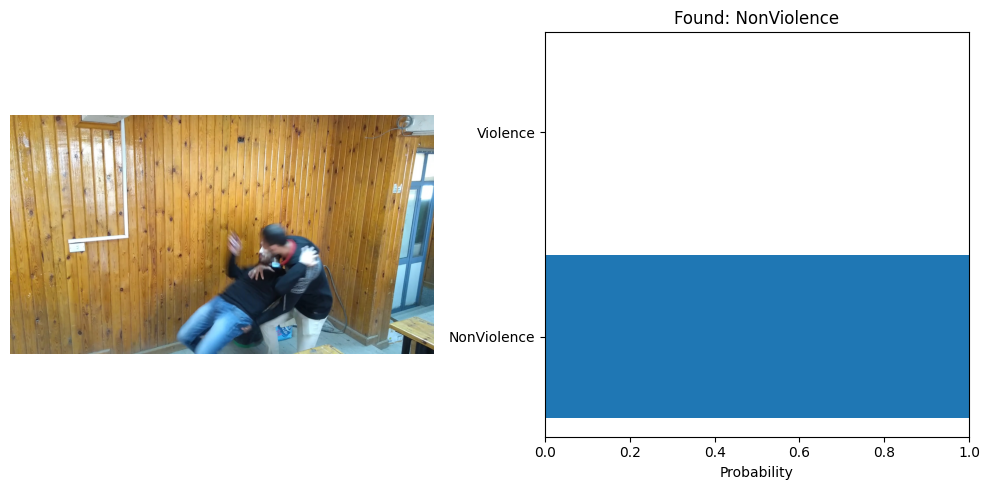

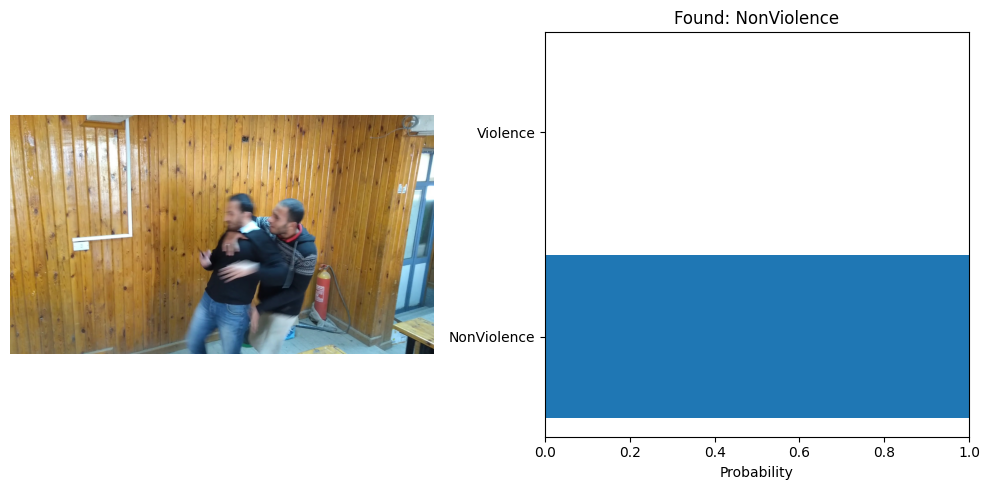

...

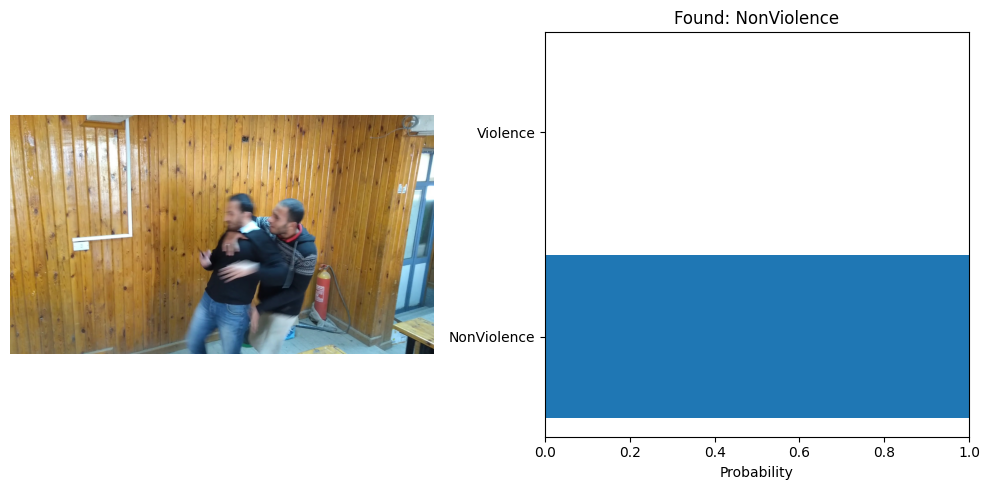

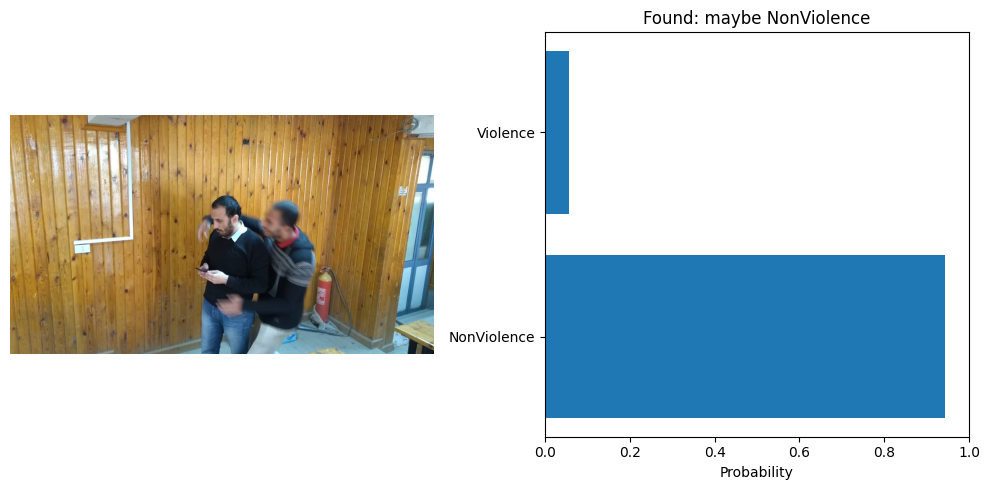

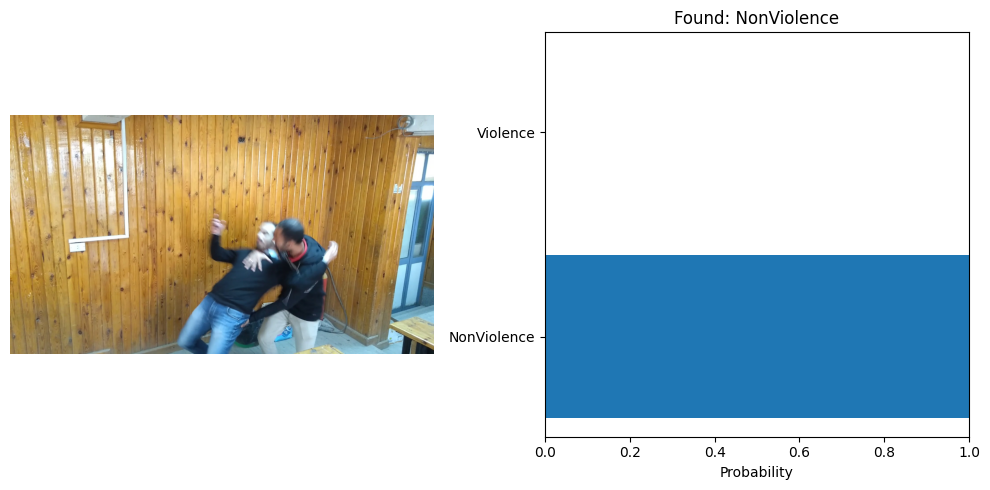

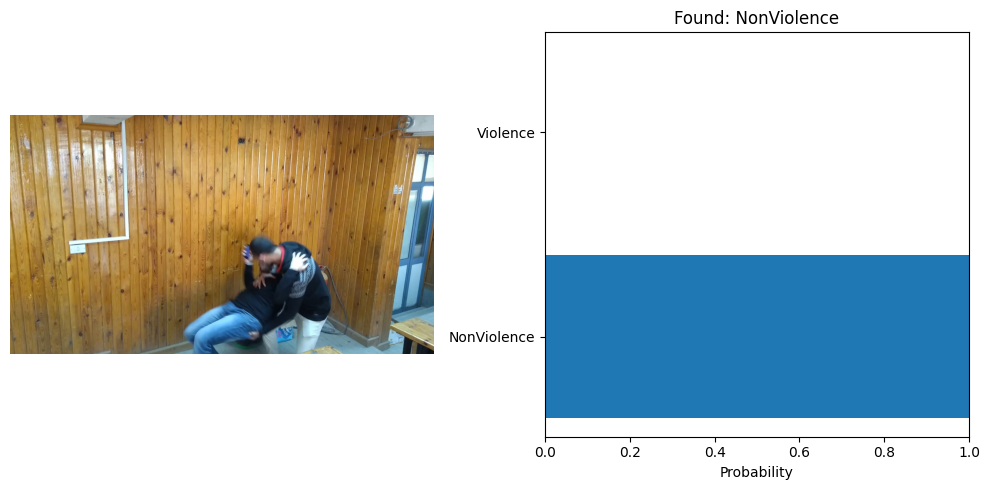

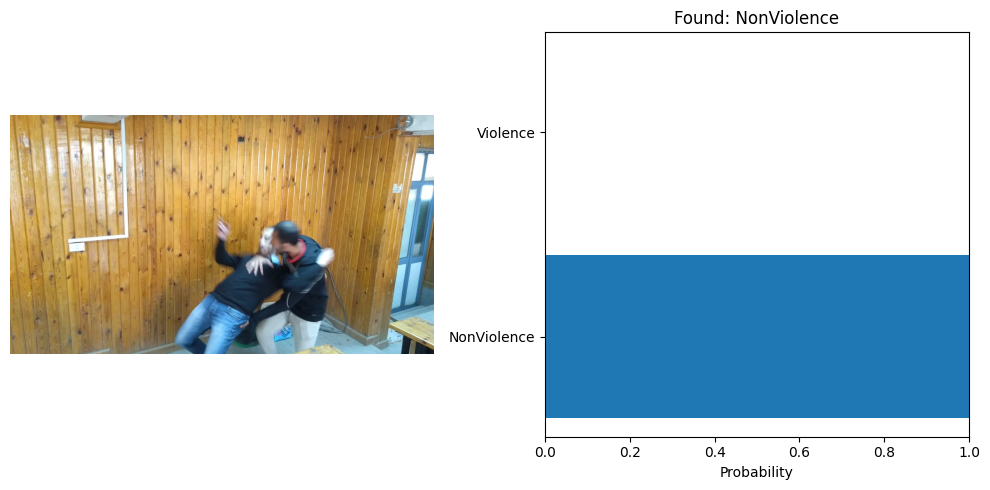

In [52]:
from glob import glob
test_images = glob('data/ValViolence/Violence/*')
test_examples = np.random.choice(test_images, 20)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example)
    probabilities = predict(model_fit, image_tensor, device)
 
    visualize_predictions(original_image, probabilities, classNames)

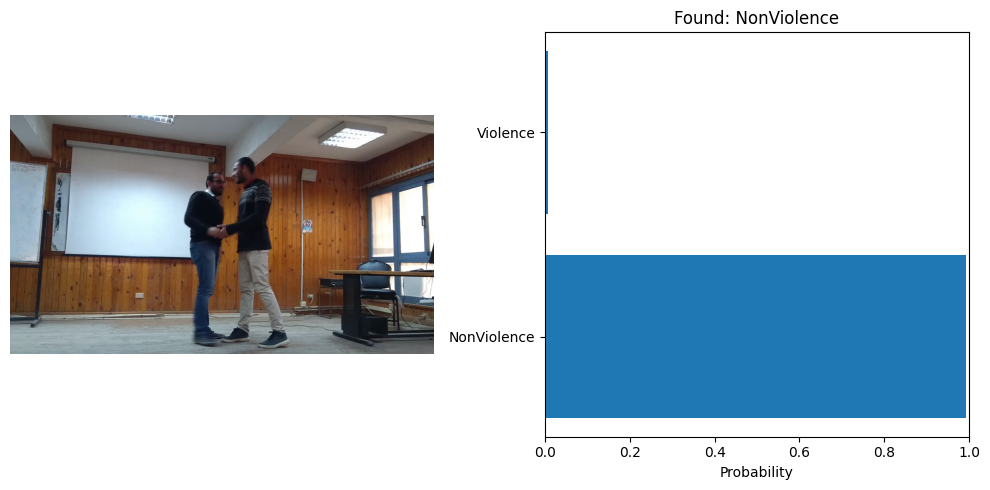

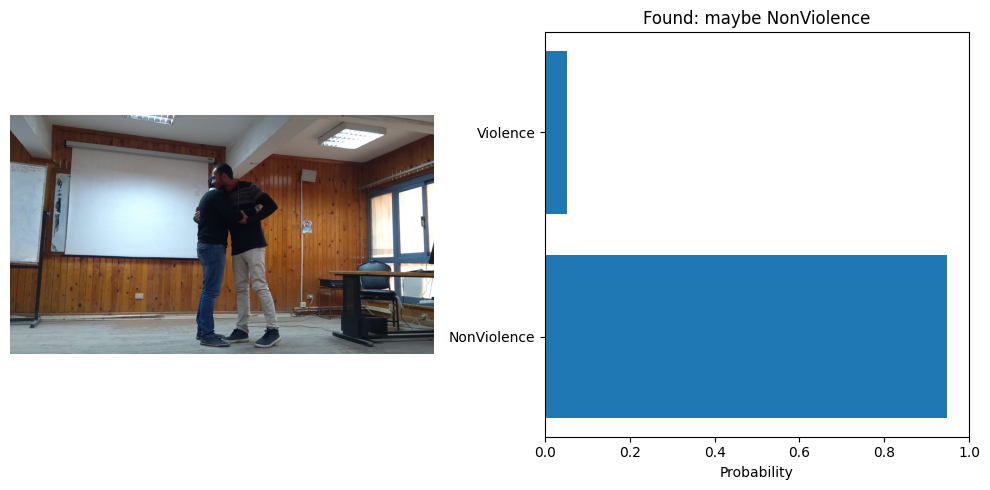

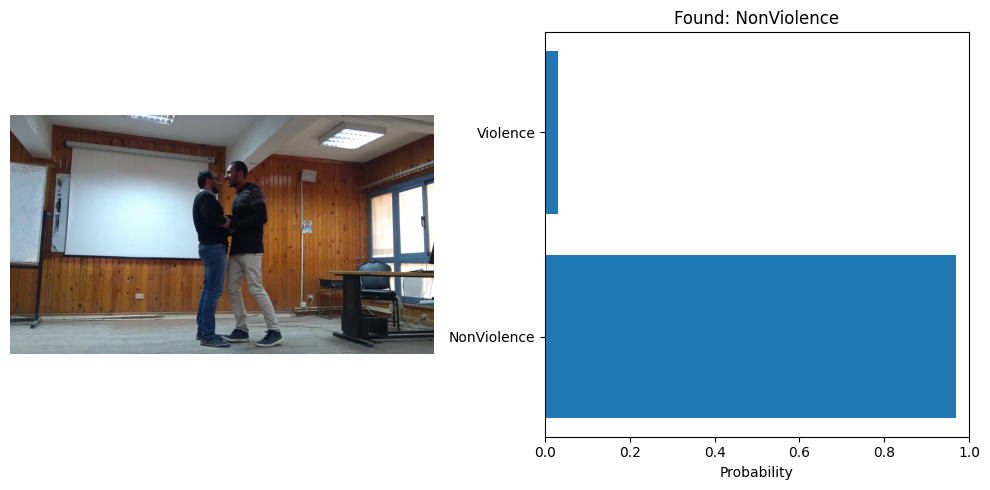

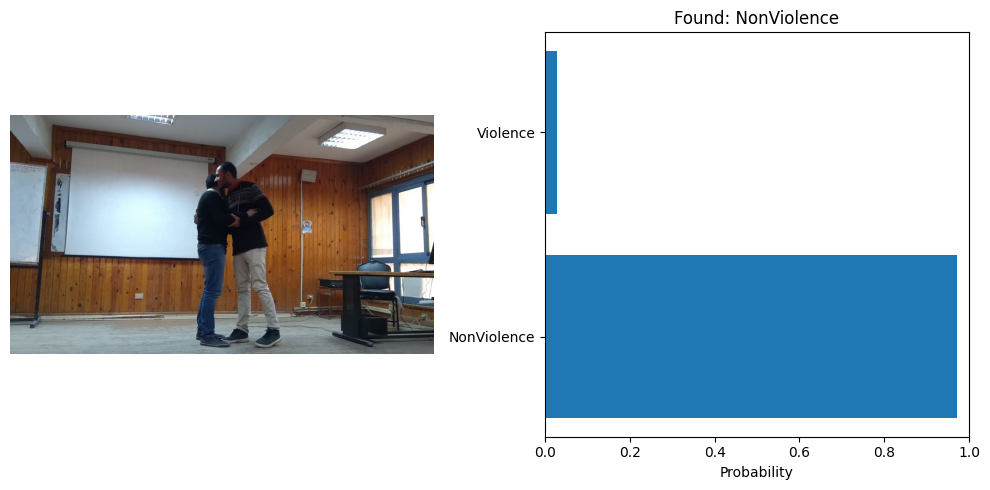

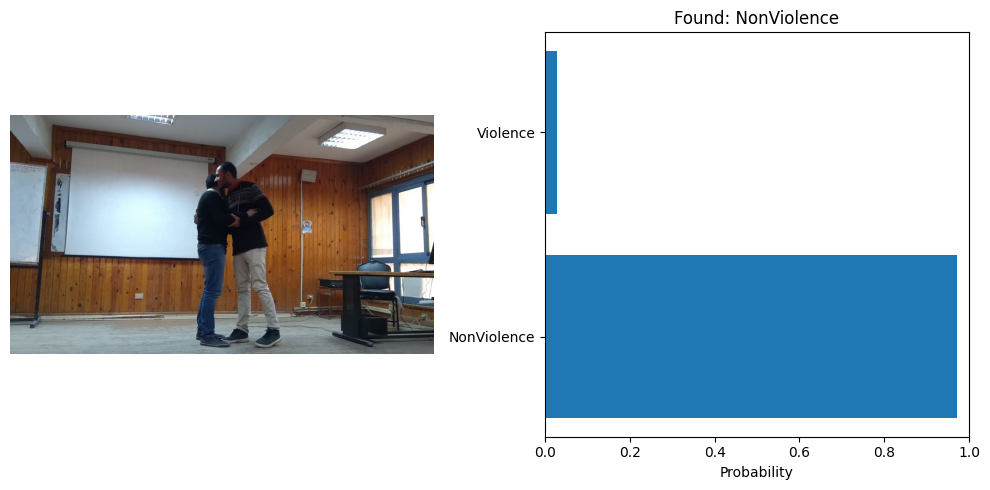

...

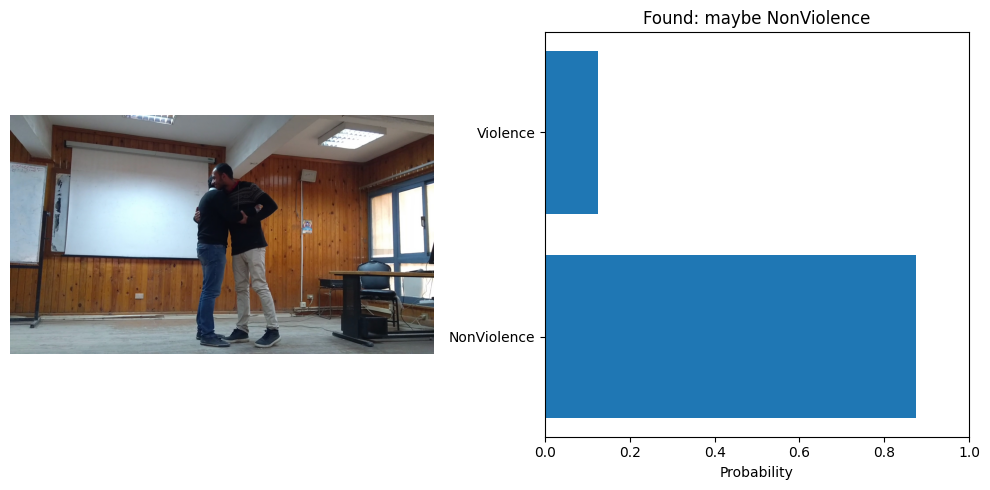

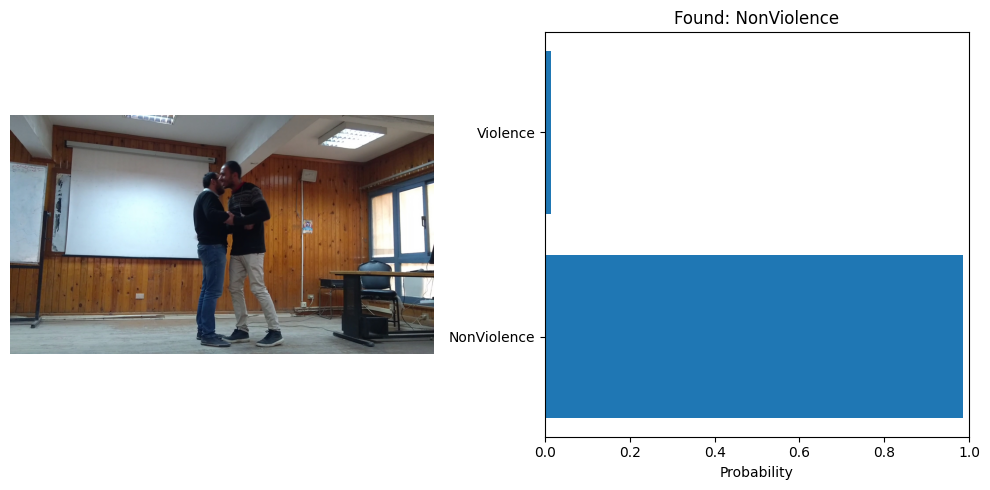

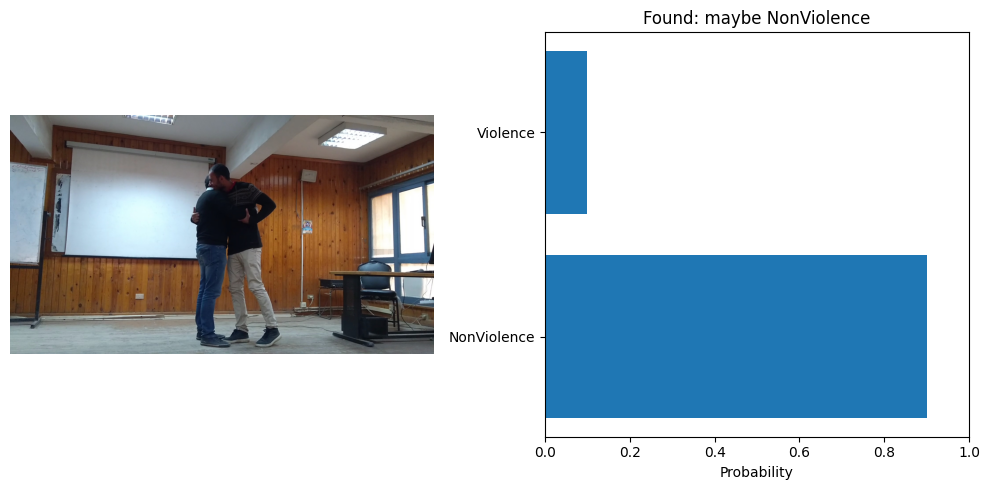

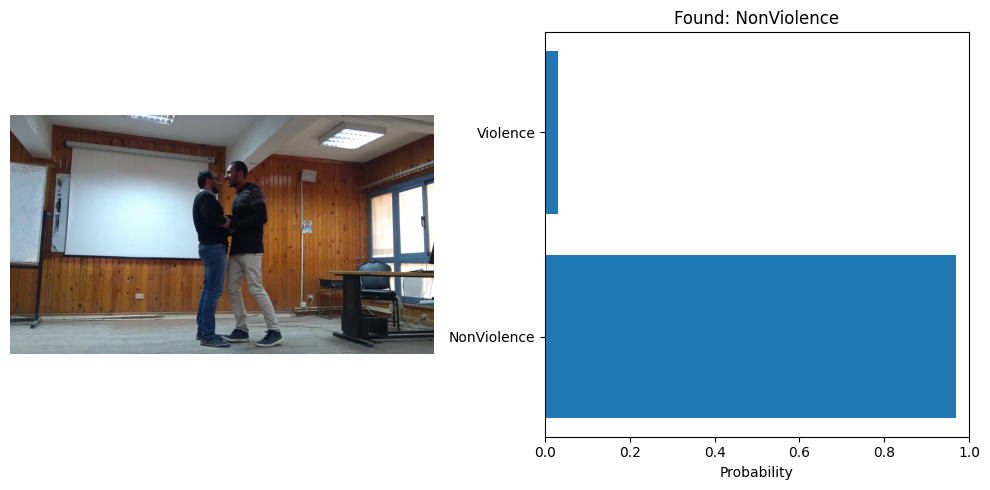

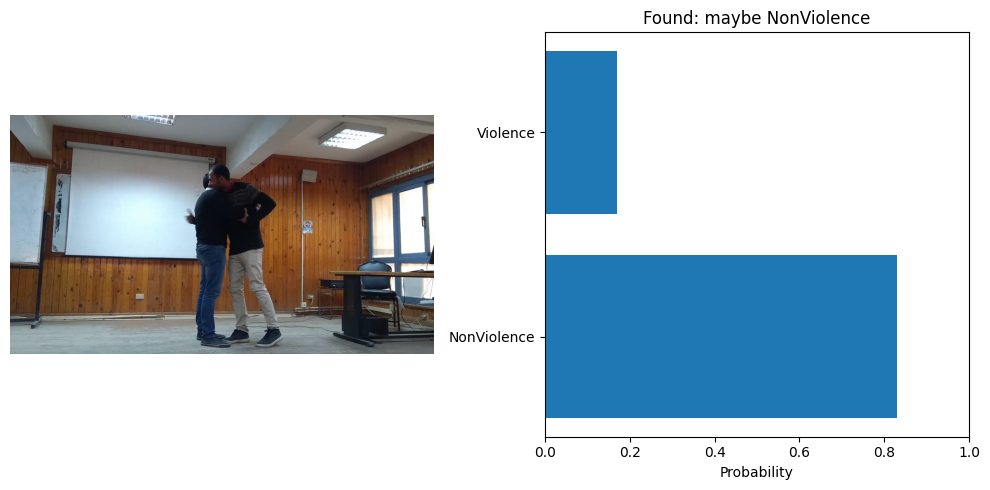

In [53]:
from glob import glob
test_images = glob('data/ValViolence/NonViolence/*')
test_examples = np.random.choice(test_images, 20)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example)
    probabilities = predict(model_fit, image_tensor, device)
 
    visualize_predictions(original_image, probabilities, classNames)

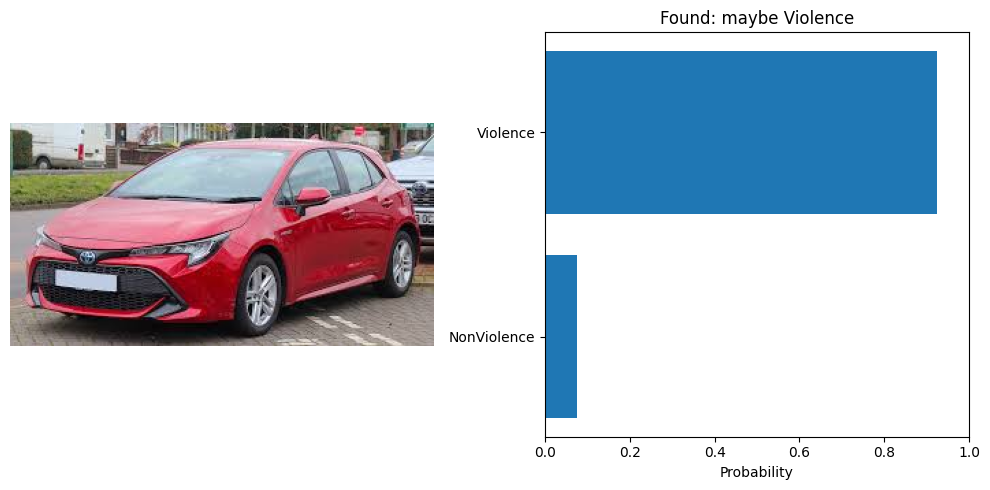

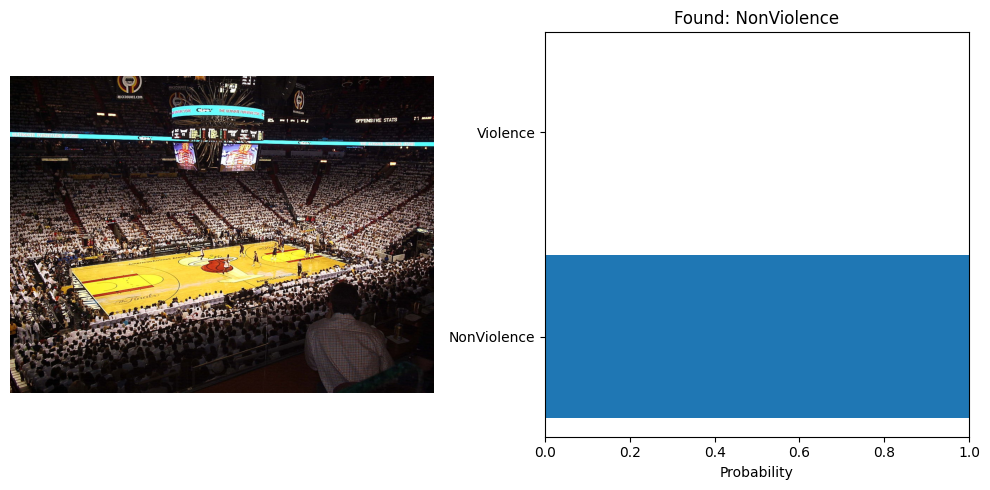

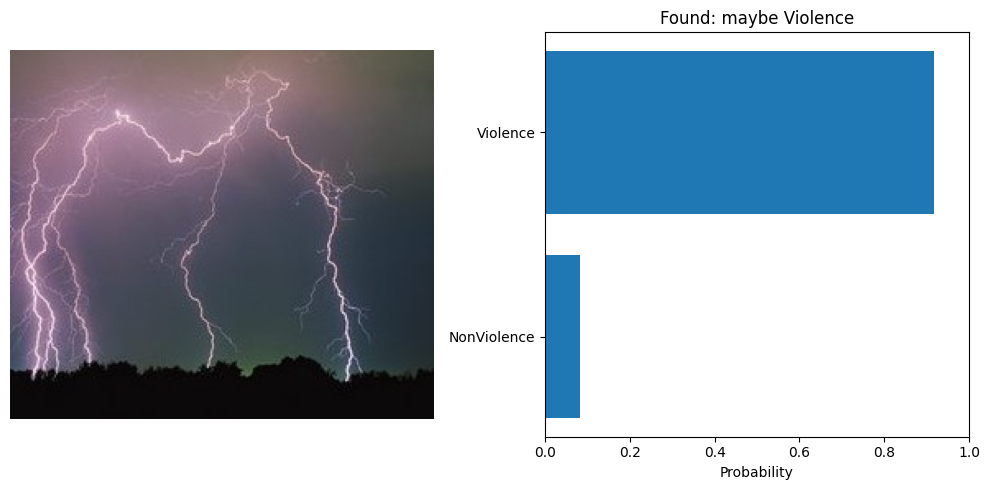

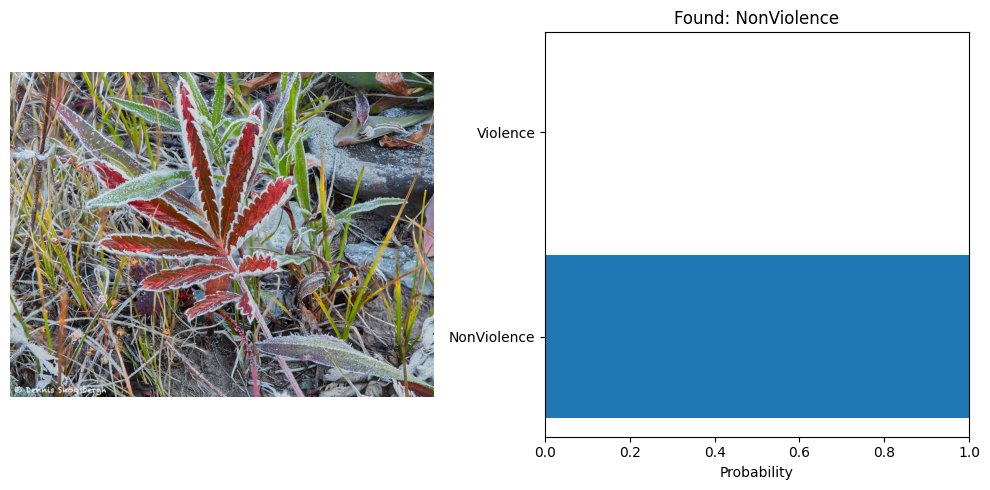

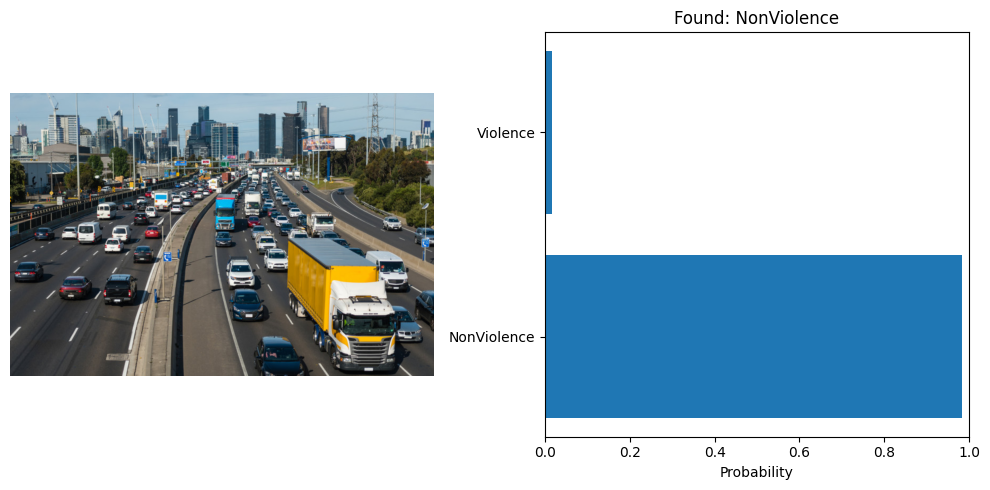

...

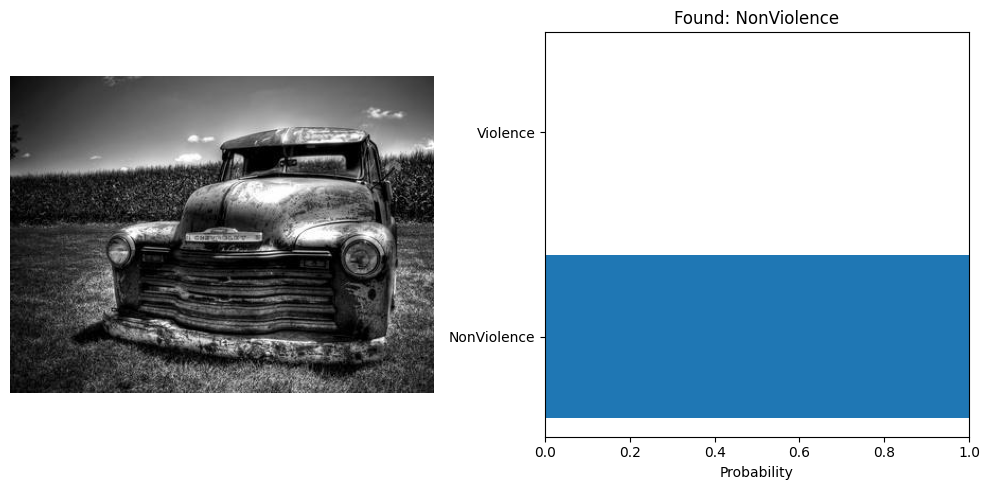

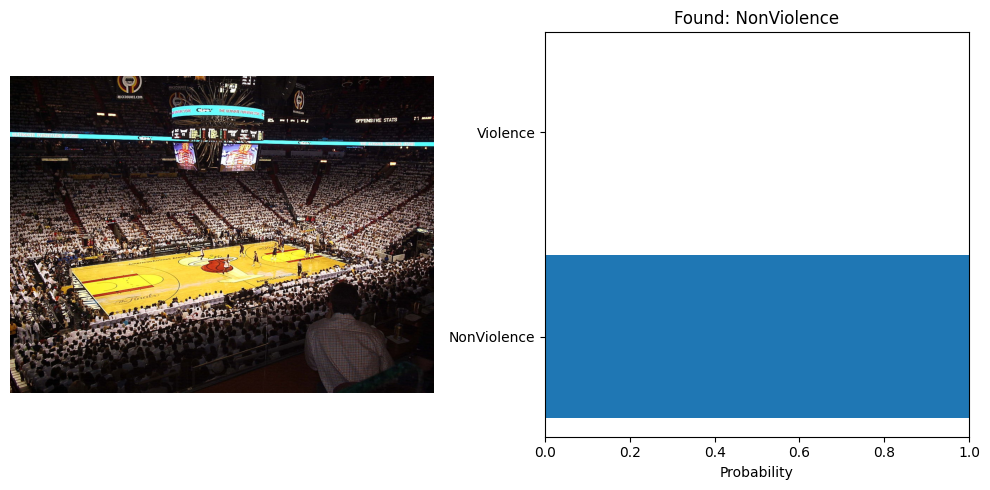

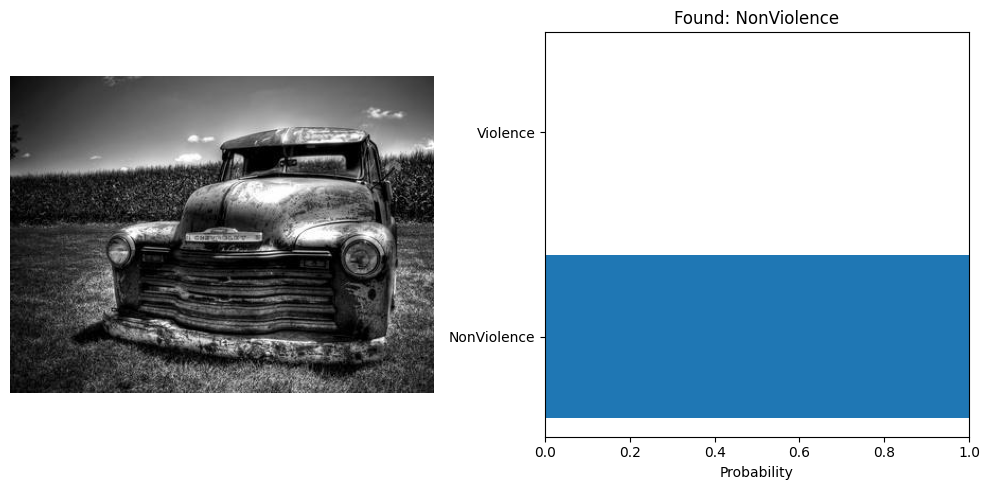

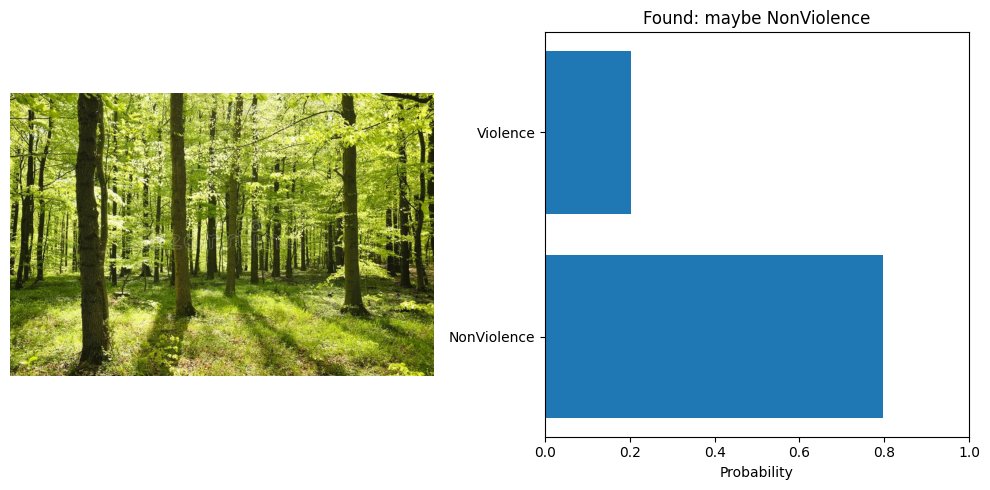

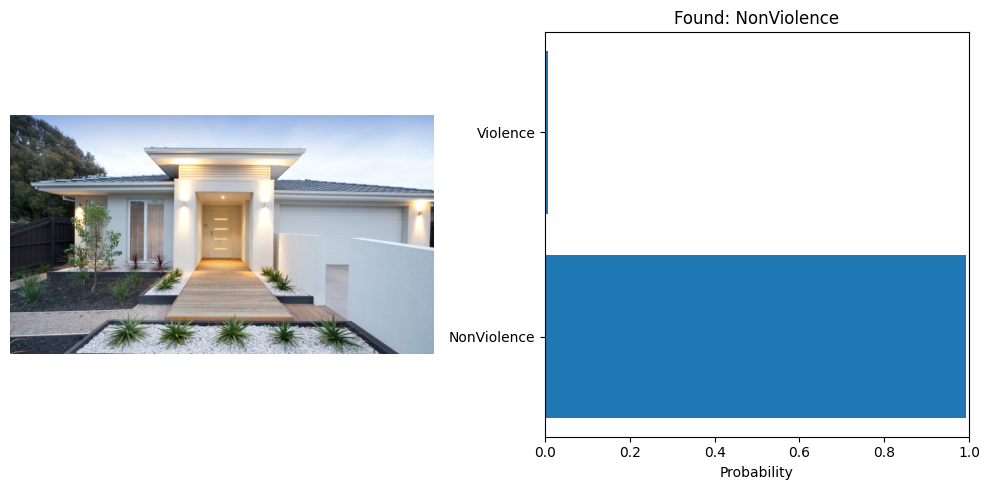

In [59]:
from glob import glob
test_images = glob('data/ValViolence/random/*')
test_examples = np.random.choice(test_images, 20)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example)
    probabilities = predict(model_fit, image_tensor, device)
 
    visualize_predictions(original_image, probabilities, classNames)